<h2> Clustering Based Clinic Locator </h2>

In [1]:
import requests
import pandas as pd
import numpy as np
import re
import googlemaps
import datetime
import folium
import joblib as joblib
import time

from sklearn.cluster import DBSCAN,KMeans
import hdbscan
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.neighbors import KNeighborsClassifier

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from tqdm import tqdm
from ipywidgets import interactive
from collections import defaultdict

<h3> Visualizing Geographical Distribution of Singapore Clinics </h3>

In [2]:
clinic_list = pd.read_csv("clinic_final.csv") 
print (clinic_list.shape)

(4376, 18)


In [3]:
#drop clinics with empty coordinates because they not located in main island
coords = clinic_list[['Latitude','Longitude']].dropna()
print (f'After dropping empty values: {coords.shape}')

#convert string to float 
columns=['Latitude','Longitude']
for col in columns:
    coords[col] = coords[col].astype(float)

#convert dataframe to array
coords = coords[["Latitude", "Longitude"]].values
print (coords)

After dropping empty values: (4375, 2)
[[  1.3484169  103.84907733]
 [  1.37697398 103.73929316]
 [  1.32099294 103.87039   ]
 ...
 [  1.39095082 103.74352507]
 [  1.4051542  103.89780522]
 [  1.30313758 103.82390715]]


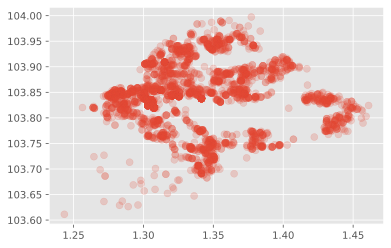

In [4]:
plt.scatter(coords[:,0], coords[:,1], alpha=0.2, s=50)

In [5]:
clinic_list = pd.read_csv("clinic_final.csv") 
print (clinic_list.shape)
    
#drop clinics with empty coordinates because they not located in main island
coords = clinic_list[['Latitude','Longitude','Name']].dropna()
print (f'After dropping empty values: {coords.shape}')

#convert string to float 
columns=['Latitude','Longitude']
for col in columns:
    coords[col] = coords[col].astype(float)

(4376, 18)
After dropping empty values: (4375, 3)


In [6]:
#https://python-visualization.github.io/folium/modules.html#module-folium.map
location_map = folium.Map(location=[coords.Latitude.mean(), coords.Longitude.mean()], zoom_start=11, 
               tiles='OpenStreetMap')

for _, row in coords.iterrows():
    folium.CircleMarker(
        location=[row.Latitude, row.Longitude],
        radius=5,
        popup=re.sub(r'[^a-zA-Z ]+', '', row.Name),
        color='#EF3340',
        fill=True,
        fill_colour='#EF3340'
    ).add_to(location_map)
    
location_map

In [7]:
#to understand the clustering in geographical visualisation
cols = ['#FF7F50', '#FF6347', '#FF4500','#FFD700','#FFA500','#FF8C00',
        '#DDA0DD','#EE82EE','#DA70D6','#FF00FF','#FF00FF','#BA55D3','#9370DB','#8A2BE2',
        '#FFC0CB','#FFB6C1','#FF69B4','#FF1493','#DB7093','#C71585','#40E0D0',
        '#E0FFFF','#00FFFF','#00FFFF','#7FFFD4','#66CDAA','#AFEEEE', 
        '#48D1CC', '#00CED1','#20B2AA','#5F9EA0','#008B8B', '#008080',
        '#87CEFA','#87CEEB','#00BFFF','#B0C4DE','#1E90FF','#6495ED',
        '#4682B4','#4169E1','#0000FF','#7B68EE','#6A5ACD','#483D8B']*10

def create_map(df, cluster_column):
    location_map = folium.Map(location=[df.Latitude.mean(), df.Longitude.mean()], zoom_start=11, tiles='OpenStreetMap')

    for _, row in df.iterrows():
        if row[cluster_column] == -1:
            cluster_colour = '#DC143C'
        else:
            cluster_colour = cols[int(row[cluster_column])]
            
        folium.CircleMarker(
            location= [row['Latitude'], row['Longitude']],
            radius=5,
            color=cluster_colour,
            fill=True,
            fill_color=cluster_colour
        ).add_to(location_map)
        
    return location_map

<h3> Data Processing </h3>

In [8]:
def load_data():
    
    clinic_list = pd.read_csv("clinic_final.csv") 
    print (clinic_list.shape)
    
    #drop clinics with empty coordinates because they not located in main island
    coords = clinic_list[['Latitude','Longitude']].dropna()
    print (f'After dropping empty values: {coords.shape}')
    
    #convert string to float 
    columns=['Latitude','Longitude']
    for col in columns:
        coords[col] = coords[col].astype(float)
    
    #drop duplicated values
    coords.drop_duplicates(subset=['Latitude','Longitude'], keep='first', inplace=True)
    print (f'After dropping duplicated values: {coords.shape}')
    
    #convert dataframe to array
    coords_input  = coords[["Latitude", "Longitude"]].values
    print (coords_input)
    
    return coords, coords_input

In [9]:
coords,coords_input = load_data()

(4376, 18)
After dropping empty values: (4375, 2)
After dropping duplicated values: (1681, 2)
[[  1.3484169  103.84907733]
 [  1.37697398 103.73929316]
 [  1.32099294 103.87039   ]
 ...
 [  1.3531648  103.96104151]
 [  1.39095082 103.74352507]
 [  1.4051542  103.89780522]]


<h3> DBSCAN Clustering </h3> 

In [10]:
coords,coords_input = load_data()

(4376, 18)
After dropping empty values: (4375, 2)
After dropping duplicated values: (1681, 2)
[[  1.3484169  103.84907733]
 [  1.37697398 103.73929316]
 [  1.32099294 103.87039   ]
 ...
 [  1.3531648  103.96104151]
 [  1.39095082 103.74352507]
 [  1.4051542  103.89780522]]


In [11]:
#earth's radius in km
kms_per_radian = 6371.0086

#define epsilon as 0.5 kilometers, converted to radians for use by haversine
#This uses the 'haversine' formula to calculate the great-circle distance between two points
# that is, the shortest distance over the earth's surface
# http://www.movable-type.co.uk/scripts/latlong.html
#epsilon = 0.5 / kms_per_radian
epsilon = 0.5/ kms_per_radian

In [12]:
#https://blog.csdn.net/rover2002/article/details/105120657/
# radians() Convert angles from degrees to radians
model = DBSCAN(eps=epsilon, min_samples=10, algorithm='ball_tree', metric='haversine').fit(np.radians(coords_input))
cluster_labels = model.labels_
#print (cluster_labels)
 
# get the number of clusters (did not ignore noisy samples which are given the label -1)
num_clusters = len(set(cluster_labels) - set([-1]))
print( 'Clustered ' + str(len(coords_input)) + ' points to ' + str(num_clusters) + ' clusters')

#Use KMeans to find centroids
''''
kmeans = KMeans(n_clusters=1, n_init=1, max_iter=30, random_state=20)
for n in range(0,num_clusters):
    print('Cluster ', n, 'Centre:')
    one_cluster = coords[cluster_labels == n]
    if n != -1:
        kk = kmeans.fit(one_cluster)
        print(kk.cluster_centers_)
    else:
        print(f'Number of outliers found: {len(coords[cluster_labels == -1])}')
        continue
'''

Clustered 1681 points to 32 clusters


"'\nkmeans = KMeans(n_clusters=1, n_init=1, max_iter=30, random_state=20)\nfor n in range(0,num_clusters):\n    print('Cluster ', n, 'Centre:')\n    one_cluster = coords[cluster_labels == n]\n    if n != -1:\n        kk = kmeans.fit(one_cluster)\n        print(kk.cluster_centers_)\n    else:\n        print(f'Number of outliers found: {len(coords[cluster_labels == -1])}')\n        continue\n"

In [13]:
'''The silhouette value is a measure of how similar an object is to its own cluster (cohesion) 
compared to other clusters (separation). The silhouette ranges from −1 to +1, where a high value
indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. 
If most objects have a high value, then the clustering configuration is appropriate. If many points have 
a low or negative value, then the clustering configuration may have too many or too few clusters.
'''
print(f'Number of outliers found: {len(coords[cluster_labels == -1])}')
print(f'Silhouette ignoring outliers: {silhouette_score(coords_input[cluster_labels!=-1],cluster_labels[cluster_labels!=-1])}')
no_outliers = 0
no_outliers = np.array([(counter+2)*x if x==-1 else x for counter, x in enumerate(cluster_labels)])
print(f'Silhouette outliers as singletons: {silhouette_score(coords_input, no_outliers)}')

Number of outliers found: 612
Silhouette ignoring outliers: 0.46578145915485103
Silhouette outliers as singletons: -0.07549670168550235


In [14]:
coords['DBSCAN'] = cluster_labels
coords.to_csv("clusters.csv",index=False)
measurement = create_map(coords, 'DBSCAN')
measurement

<h3> HDBSCAN </h3>

In [15]:
#https://github.com/SouravGupta143/Geolocation_Clustering

model = hdbscan.HDBSCAN(cluster_selection_epsilon=epsilon, min_samples=15, min_cluster_size=2,algorithm='best', metric='haversine')
cluster_labels = model.fit_predict(np.radians(coords_input))

#model = hdbscan.HDBSCAN(cluster_selection_epsilon=epsilon, min_samples=5, min_cluster_size=5,algorithm='best')
#cluster_labels = model.fit_predict(coords_input)

print(f'Number of clusters found: {len(np.unique(cluster_labels))-1}')
print(f'Number of outliers found: {len(cluster_labels[cluster_labels==-1])}')

Number of clusters found: 26
Number of outliers found: 567


In [16]:
print(f'Silhouette ignoring outliers: {silhouette_score(coords_input[cluster_labels!=-1],cluster_labels[cluster_labels!=-1])}')
no_outliers = 0
no_outliers = np.array([(counter+2)*x if x==-1 else x for counter, x in enumerate(cluster_labels)])
print(f'Silhouette outliers as singletons: {silhouette_score(coords_input, no_outliers)}')

Silhouette ignoring outliers: 0.5219602208798192
Silhouette outliers as singletons: -0.14673722996075736


In [17]:
coords['HDBSCAN'] = cluster_labels
coords.to_csv("clusters.csv",index=False)
measurement = create_map(coords, 'HDBSCAN')
measurement

In [18]:
#handling outliers using KNN
classifier = KNeighborsClassifier(n_neighbors=1)
df_train = coords[coords.HDBSCAN!=-1]
df_predict = coords[coords.HDBSCAN==-1]

In [19]:
X_train = np.array(df_train[['Longitude', 'Latitude']], dtype='float64')
y_train = np.array(df_train['HDBSCAN'])
X_predict = np.array(df_predict[['Longitude', 'Latitude']], dtype='float64')

In [20]:
classifier.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [21]:
predictions = classifier.predict(X_predict)
#print (predictions)
coords['HDBSCAN_KNN'] = coords['HDBSCAN']
coords.loc[coords.HDBSCAN==int(-1), 'HDBSCAN_KNN'] = predictions

In [22]:
class_predictions = coords.HDBSCAN_KNN
print(f'Number of clusters found: {len(np.unique(class_predictions))}')
print(f'Silhouette: {silhouette_score(coords, class_predictions)}')

Number of clusters found: 26
Silhouette: -0.1209131326343896


In [23]:
coords.to_csv("clusters.csv",index=False)
measurement = create_map(coords, 'HDBSCAN_KNN')
measurement

<h3> KMeans Clustering </h3>

In [24]:
#best parameters k=25, n=16, score=0.45

'''best_silhouette, best_k, best_n = -1, 0, 0 

for k in tqdm(range(25,50)):
    for n in range(1,20):
        model = KMeans(n_clusters=k, random_state=n).fit(coords_input)
        cluster_labels = model.predict(coords_input)
        
        curr_silhouette = silhouette_score(coords_input, cluster_labels)
        if curr_silhouette > best_silhouette:
            best_k = k
            best_n = n
            best_silhouette = curr_silhouette
        
print(f'K={best_k}')
print(f'n={best_n}')
print(f'Silhouette Score: {best_silhouette}')'''

"best_silhouette, best_k, best_n = -1, 0, 0 \n\nfor k in tqdm(range(25,50)):\n    for n in range(1,20):\n        model = KMeans(n_clusters=k, random_state=n).fit(coords_input)\n        cluster_labels = model.predict(coords_input)\n        \n        curr_silhouette = silhouette_score(coords_input, cluster_labels)\n        if curr_silhouette > best_silhouette:\n            best_k = k\n            best_n = n\n            best_silhouette = curr_silhouette\n        \nprint(f'K={best_k}')\nprint(f'n={best_n}')\nprint(f'Silhouette Score: {best_silhouette}')"

In [25]:
#there are 28 postal districts in Singapore, therefore differentiate the data to 28 clusters
k = 30
model = KMeans(n_clusters=k, random_state=16).fit(coords_input)
cluster_labels = model.predict(coords_input)
# get the number of clusters (did not ignore noisy samples which are given the label -1)
num_clusters = len(set(cluster_labels) - set([-1]))
print( 'Clustered ' + str(len(coords_input)) + ' points to ' + str(num_clusters) + ' clusters')

Clustered 1681 points to 30 clusters


In [26]:
print(f'K={k}')
print(f'Silhouette Score: {silhouette_score(coords_input, cluster_labels)}')

K=30
Silhouette Score: 0.44482760865265714


In [27]:
#30 clusters work better than 25 clusters though the silhouette score is lower because it clearly differentiate off-island points
coords['kmeans'] = cluster_labels
coords.to_csv("clusters.csv",index=False)
measurement = create_map(coords, 'kmeans')
measurement
measurement.save('map.html')

In [28]:
#save the model
filename = 'final_model.sav'
joblib.dump(model, filename)

['final_model.sav']

<h3> Compare the Models </h3>

Text(0.5, 0, 'Cluster Sizes')

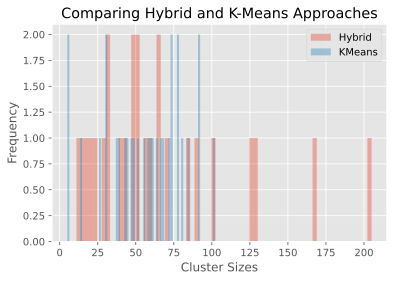

In [29]:
cluster = pd.read_csv("clusters.csv")
cluster['HDBSCAN_KNN'].value_counts().plot.hist(bins=70, alpha=0.4, 
                                              label='Hybrid')
cluster['kmeans'].value_counts().plot.hist(bins=70, alpha=0.4,
                                               label='KMeans')
plt.legend()
plt.title('Comparing Hybrid and K-Means Approaches')
plt.xlabel('Cluster Sizes')

<h3> Test KMeans with Input Data </h3>

In [30]:
filename = 'final_model.sav'
loaded_model = joblib.load(filename)

In [31]:
#Use postal code to find x,y coordinates from one map
#https://docs.onemap.sg/#4326-wgs84-to-3857
def get_coordinates(postal_code):
    
    #define variables based on API requirements
    postal_code = postal_code
    page = 1
    results = []
    
    while True:
        try:
            #usage:/commonapi/search?searchVal={SearchText}&returnGeom={Y/N}&getAddrDetails={Y/N}&pageNum={PageNumber}
            response = requests.get('http://developers.onemap.sg/commonapi/search?searchVal={0}&returnGeom=Y&getAddrDetails=Y&pageNum={1}'
                                    .format(postal_code, page)).json()
        except requests.exceptions.ConnectionError as e:
            print('Fetching {} failed. Retrying in 2 sec'.format(postal_code))
            time.sleep(2)
            continue
        
        results =  response['results']
        
        if response['totalNumPages'] > page:
            page = page + 1
        else:
            break
            
            
    return results

In [32]:
postal_code = "554910"

buildings = get_coordinates(postal_code)

print (buildings[0])

postal_code = buildings[0]['POSTAL']
print(postal_code)

latitude = buildings[0]['LATITUDE']
print(latitude)

longitude = buildings[0]['LONGITUDE']
print(longitude)

{'SEARCHVAL': '6 SERANGOON NORTH AVENUE 5 SINGAPORE 554910', 'BLK_NO': '6', 'ROAD_NAME': 'SERANGOON NORTH AVENUE 5', 'BUILDING': 'NIL', 'ADDRESS': '6 SERANGOON NORTH AVENUE 5 SINGAPORE 554910', 'POSTAL': '554910', 'X': '31980.090760000003', 'Y': '39607.045210000004', 'LATITUDE': '1.374466297', 'LONGITUDE': '103.86908259999998', 'LONGTITUDE': '103.86908259999998'}
554910
1.374466297
103.86908259999998


In [33]:
#user input data
user_input = np.array([float(latitude),float(longitude)])
user_input = user_input.reshape(1, -1)
cluster_labels_predicted = loaded_model.predict(user_input)
print(cluster_labels_predicted)

[21]


In [34]:
#return the list of coordinates that are in cluster 8
path_full = "clinic_final.csv"
path_cluster = "clusters.csv"

#get all the clinic list 
clinic_full = pd.read_csv (path_full)
coordinates = pd.read_csv (path_cluster)
clinic_cluster = coordinates.loc[coordinates['kmeans'] == int(cluster_labels_predicted)]
print(clinic_cluster)
print(clinic_cluster.shape)

      Latitude   Longitude  DBSCAN  HDBSCAN  HDBSCAN_KNN  kmeans
11    1.350352  103.868997      16        9            9      21
88    1.354062  103.871214      16        9            9      21
107   1.353671  103.870757      16        9            9      21
170   1.353097  103.876441      16        9            9      21
305   1.355391  103.877255      16        9            9      21
318   1.369951  103.872312      -1        9            9      21
379   1.357324  103.873635      16        9            9      21
402   1.353231  103.872044      16        9            9      21
413   1.351443  103.879513      16        9            9      21
448   1.341370  103.877817      -1       -1            9      21
484   1.369890  103.869150      -1        9            9      21
499   1.348972  103.868363      -1        9            9      21
522   1.349308  103.862310      -1       -1            9      21
536   1.360203  103.869762      -1        9            9      21
544   1.357951  103.86425

In [35]:
#return the list of clinics that are on these coordinates
columns=['Latitude','Longitude']
for col in columns:
    clinic_full[col] = clinic_full[col].astype(float)
clinics = pd.merge(clinic_full, clinic_cluster, how='left', on=['Latitude','Longitude'])
clinics= clinics.loc[clinics['kmeans'] == int(cluster_labels_predicted)]
clinics = clinics.head(5)
clinics['Distance'] = pd.Series(np.zeros(len(clinics)), index=clinics.index)
clinics['Travel Time'] = pd.Series(np.zeros(len(clinics)), index=clinics.index)
clinics.head(5)

,Sno,Name,Contact Number,Fax,Address,Opening Hours,Link,Service,24 Hour,Medical,...,PHPC,Postal,Latitude,Longitude,DBSCAN,HDBSCAN,HDBSCAN_KNN,kmeans,Distance,Travel Time
108,109,ADVANCED DENTAL CLINIC SERANGOON PTE LTD,62801011.0,64744011,BLK 254 SERANGOON CENTRAL DRIVE #01-213 Singap...,"Monday to Friday : 08:30 am to 12:30 pm, 01:30...",http://hcidirectory.sg/hcidirectory/clinic.do?...,NaN,0,0,...,0,550254,1.354062,103.871214,16.0,9.0,9.0,21.0,0.0,0.0
271,272,ASHFORD DENTAL CENTRE SERANGOON,62659146.0,64815877,15 TECK CHYE TERRACE Singapore 545723,Please call the clinic for operating hours,http://hcidirectory.sg/hcidirectory/clinic.do?...,General Dental,0,0,...,0,545723,1.353097,103.876441,16.0,9.0,9.0,21.0,0.0,0.0
563,564,CHAN DENTAL CLINIC & SURGERY,62825903.0,62506632,22 YIO CHU KANG RD HIGHLAND CENTRE #01-17 Sing...,Please call the clinic for operating hours,http://hcidirectory.sg/hcidirectory/clinic.do?...,General Dental,0,0,...,0,545535,1.355391,103.877255,16.0,9.0,9.0,21.0,0.0,0.0
590,591,CHEN FAMILY CLINIC,62812212.0,62813309,BLK 153 SERANGOON NORTH AVE 1 #01-490 Singapor...,"Monday and Tuesday : 08:30 am to 12:30 pm, 02:...",http://hcidirectory.sg/hcidirectory/clinic.do?...,General Medical,0,1,...,1,550153,1.369951,103.872312,-1.0,9.0,9.0,21.0,0.0,0.0
746,747,CRYSTAL DENTAL CARE,66121955.0,63693480,BLK 262 SERANGOON CENTRAL DRIVE #01-109 Singap...,Monday to Saturday : 09:00 am to 08:00 pm,http://hcidirectory.sg/hcidirectory/clinic.do?...,General Dental,0,0,...,0,550262,1.353231,103.872044,16.0,9.0,9.0,21.0,0.0,0.0


In [36]:
#search google map for timing
#https://github.com/googlemaps/google-maps-services-python
#https://medium.com/how-to-use-google-distance-matrix-api-in-python/how-to-use-google-distance-matrix-api-in-python-ef9cd895303c

google_maps = googlemaps.Client(key='Your Google API')

for index, row in clinics.iterrows():
    #Assign latitude and longitude as origin/departure points
    origins = (float(latitude),float(longitude))
    
    #Assign latitude and longitude from the next row as the destination point
    destination = (row['Latitude'] ,row['Longitude'])
    
    #pass origin and destination variables to distance_matrix function# output in meters
    result = google_maps.distance_matrix(origins, destination, mode='walking')["rows"][0]["elements"][0]["distance"]["value"]
    clinics.loc[index,'Distance'] = result
    print (result)
    
    now = datetime.datetime.now()
    directions = google_maps.directions(origins, destination, mode='walking',departure_time=now)
    travel_time = directions[0].get('legs')[0].get('duration').get('text')
    clinics.loc[index,'Travel Time'] = travel_time
    print(travel_time)

3028
39 mins
3113
40 mins
2771
36 mins
961
13 mins
2951
38 mins


In [37]:
#It can give decent results in neighbourhood
clinics.head(5)

,Sno,Name,Contact Number,Fax,Address,Opening Hours,Link,Service,24 Hour,Medical,...,PHPC,Postal,Latitude,Longitude,DBSCAN,HDBSCAN,HDBSCAN_KNN,kmeans,Distance,Travel Time
108,109,ADVANCED DENTAL CLINIC SERANGOON PTE LTD,62801011.0,64744011,BLK 254 SERANGOON CENTRAL DRIVE #01-213 Singap...,"Monday to Friday : 08:30 am to 12:30 pm, 01:30...",http://hcidirectory.sg/hcidirectory/clinic.do?...,NaN,0,0,...,0,550254,1.354062,103.871214,16.0,9.0,9.0,21.0,3028.0,39 mins
271,272,ASHFORD DENTAL CENTRE SERANGOON,62659146.0,64815877,15 TECK CHYE TERRACE Singapore 545723,Please call the clinic for operating hours,http://hcidirectory.sg/hcidirectory/clinic.do?...,General Dental,0,0,...,0,545723,1.353097,103.876441,16.0,9.0,9.0,21.0,3113.0,40 mins
563,564,CHAN DENTAL CLINIC & SURGERY,62825903.0,62506632,22 YIO CHU KANG RD HIGHLAND CENTRE #01-17 Sing...,Please call the clinic for operating hours,http://hcidirectory.sg/hcidirectory/clinic.do?...,General Dental,0,0,...,0,545535,1.355391,103.877255,16.0,9.0,9.0,21.0,2771.0,36 mins
590,591,CHEN FAMILY CLINIC,62812212.0,62813309,BLK 153 SERANGOON NORTH AVE 1 #01-490 Singapor...,"Monday and Tuesday : 08:30 am to 12:30 pm, 02:...",http://hcidirectory.sg/hcidirectory/clinic.do?...,General Medical,0,1,...,1,550153,1.369951,103.872312,-1.0,9.0,9.0,21.0,961.0,13 mins
746,747,CRYSTAL DENTAL CARE,66121955.0,63693480,BLK 262 SERANGOON CENTRAL DRIVE #01-109 Singap...,Monday to Saturday : 09:00 am to 08:00 pm,http://hcidirectory.sg/hcidirectory/clinic.do?...,General Dental,0,0,...,0,550262,1.353231,103.872044,16.0,9.0,9.0,21.0,2951.0,38 mins
